### Importe de librerias

In [31]:
# Carga las librerias
from deepforest import main
from deepforest import get_data
from deepforest.visualize import plot_results
import pandas as pd
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random #

### Inicializacion del modelo

In [16]:
# Inicializa el modelo
model = main.deepforest()

# Carga el modelo preentrenado desde Hugging Face
model.load_model(model_name="weecology/deepforest-tree", revision="main")

Reading config file: C:\Users\overd\AppData\Roaming\Python\Python312\site-packages\deepforest\data\deepforest_config.yml


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Reading config file: C:\Users\overd\AppData\Roaming\Python\Python312\site-packages\deepforest\data\deepforest_config.yml


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


### Cargue de imagen de prueba

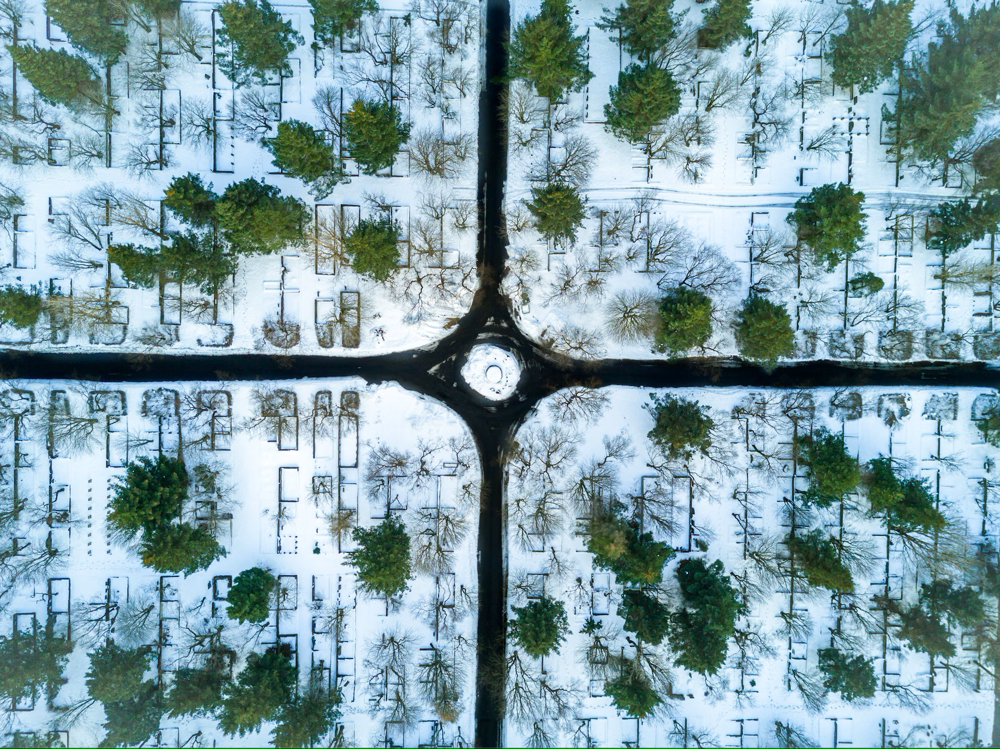

In [17]:
my_image_path = r"D:\Documentos\Sede_De_La_Paz\2025\2025-1s\Vision por computador\GitHub\deepforest-gamma\Arboles3.png"  # ¡Cambia esto por la ruta real de tu imagen!

# 3. Carga y visualiza tu imagen
try:
    img_in = Image.open(my_image_path)
    display(img_in)
except FileNotFoundError:
    print(f"Error: No se encontró la imagen en la ruta: {my_image_path}")
except Exception as e:
    print(f"Ocurrió un error al cargar la imagen: {e}")

### Detección de arboles

--- Bloque 1: Detección y Visualización ---
Iniciando detección de árboles en 'D:\Documentos\Sede_De_La_Paz\2025\2025-1s\Vision por computador\GitHub\deepforest-gamma\Arboles3.png'...
Detección completada.


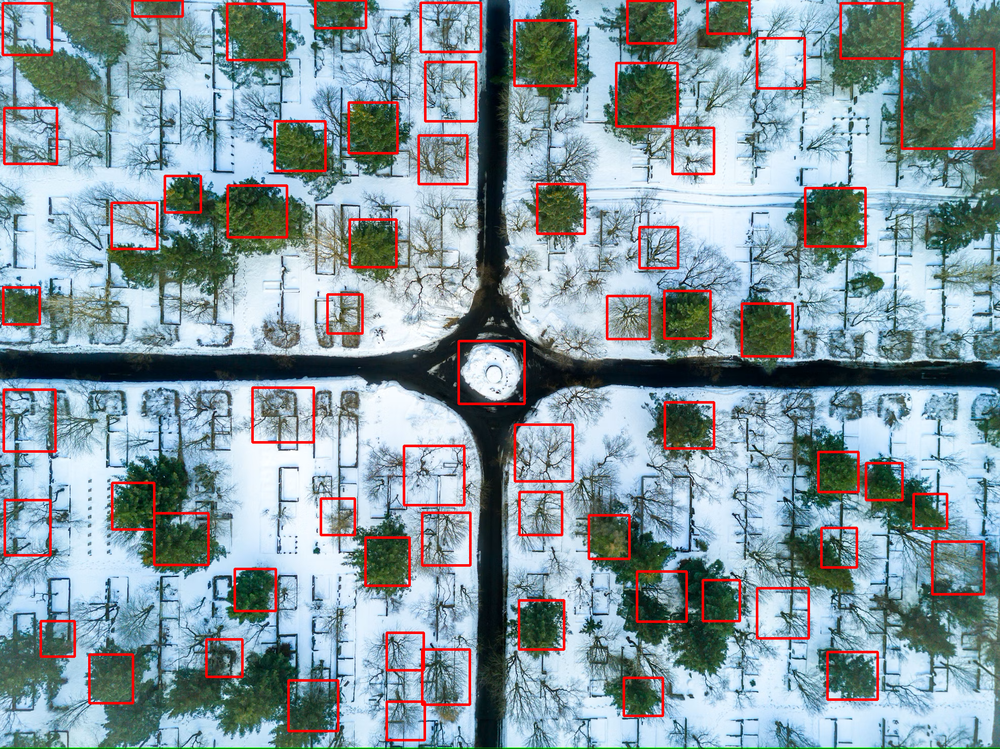

Árboles detectados visualizados en 'D:\Documentos\Sede_De_La_Paz\2025\2025-1s\Vision por computador\GitHub\deepforest-gamma\Arboles3.png'.
Número total de árboles detectados: 63


In [18]:
# Realiza la detección de árboles usando el modelo preentrenado

try:
    print(f"--- Bloque 1: Detección y Visualización ---")
    print(f"Iniciando detección de árboles en '{my_image_path}'...")

    # El resultado de predict_image es el DataFrame con las detecciones
    detections_df = model.predict_image(path=my_image_path)
    print("Detección completada.")

    # --- Visualización de los árboles detectados en la imagen ---
    img_cv2 = cv2.imread(my_image_path)

    if img_cv2 is not None:
        # Define el color de los recuadros (ej. rojo brillante en BGR)
        desired_color_bgr = (0, 0, 255)
        line_thickness = 3 # Grosor de la línea del recuadro

        # Itera sobre las detecciones y dibuja los recuadros
        for index, row in detections_df.iterrows():
            # Las coordenadas de DeepForest son xmin, ymin, xmax, ymax
            xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
            cv2.rectangle(img_cv2, (xmin, ymin), (xmax, ymax), desired_color_bgr, line_thickness)

        # Convierte la imagen de OpenCV (BGR) a PIL (RGB) para display() y la muestra
        img_display = Image.fromarray(cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB))
        display(img_display)
        print(f"Árboles detectados visualizados en '{my_image_path}'.")
    else:
        print("Error: La imagen no pudo ser cargada o procesada por OpenCV para visualización.")

    # Mostrar el número total de árboles detectados
    # Usamos len(detections_df) para obtener el número de filas en el DataFrame
    print(f"Número total de árboles detectados: {len(detections_df)}")

except Exception as e:
    print(f"Ocurrió un error durante la detección o visualización en el Bloque 1: {e}")

#### Arboles detectados

In [13]:
print(f"Número de árboles detectados: {len(img_out)}")

Número de árboles detectados: 63


### Calculo de areas

In [ ]:
# Cálculo de Áreas y Generación de DataFrame ---

if 'detections_df' in locals() and not detections_df.empty:
    try:
        print(f"\n--- Bloque 2: Cálculo de Áreas y Generación de DataFrame ---")

        # 1. Calcula el ancho y el alto de cada caja
        detections_df['width'] = detections_df['xmax'] - detections_df['xmin']
        detections_df['height'] = detections_df['ymax'] - detections_df['ymin']

        # 2. Calcula el área en píxeles y la añade como una nueva columna 'area_px'
        detections_df['area_px'] = detections_df['width'] * detections_df['height']

        # 3. Añade una columna 'id_arbol' usando el índice del DataFrame como ID único
        detections_df['id_arbol'] = detections_df.index

        # 4. Crea el DataFrame final con las columnas solicitadas
        final_tree_data_df = detections_df[['id_arbol', 'xmin', 'ymin', 'xmax', 'ymax', 'area_px']]

        print("\nDataFrame de resultados completo:")

        # --- CAMBIOS AQUÍ PARA MOSTRAR EL DATAFRAME COMPLETO ---
        # Configurar opciones de Pandas para mostrar todas las filas y columnas
        pd.set_option('display.max_rows', None) # Muestra todas las filas
        pd.set_option('display.max_columns', None) # Muestra todas las columnas (si tuvieras muchas)
        pd.set_option('display.width', 1000) # Evita que se trunquen las columnas si el ancho es insuficiente
        # Puedes añadir también si quieres ver todos los floats sin truncar:
        # pd.set_option('display.float_format', '{:.2f}'.format)

        print(final_tree_data_df) # Ahora esto imprimirá el DataFrame completo

        # Opcional: Restablecer las opciones de Pandas a sus valores por defecto
        # Esto es útil si vas a trabajar con muchos DataFrames y no siempre quieres verlos completos
        # pd.reset_option('display.max_rows')
        # pd.reset_option('display.max_columns')
        # pd.reset_option('display.width')
        # pd.reset_option('display.float_format')


        print(f"\nEl DataFrame final contiene {len(final_tree_data_df)} registros de árboles.")

    except Exception as e:
        print(f"Ocurrió un error durante el cálculo de áreas o la generación del DataFrame en el Bloque 2: {e}")
else:
    print("\nNo se detectaron árboles o el DataFrame de detecciones no está disponible del Bloque 1.")


--- Bloque 2: Cálculo de Áreas y Generación de DataFrame ---

DataFrame de resultados completo:
    id_arbol    xmin    ymin    xmax    ymax  area_px
0          0  1216.0   124.0  1337.0   249.0  15125.0
1          1  1589.0   371.0  1708.0   486.0  13685.0
2          2  1311.0   574.0  1402.0   668.0   8554.0
3          3  1464.0   599.0  1564.0   703.0  10400.0
4          4  1015.0    40.0  1136.0   169.0  15609.0
5          5   542.0   239.0   642.0   337.0   9800.0
6          6  1060.0   363.0  1154.0   461.0   9212.0
7          7   688.0   202.0   784.0   302.0   9600.0
8          8   690.0   433.0   782.0   527.0   8648.0
9          9   826.0   267.0   922.0   363.0   9216.0
10        10   449.0   366.0   566.0   468.0  11934.0
11        11  1312.0   794.0  1409.0   885.0   8827.0
12        12  1198.0   584.0  1282.0   669.0   7140.0
13        13  1024.0  1185.0  1113.0  1282.0   8633.0
14        14   905.0   673.0  1035.0   797.0  16120.0
15        15   721.0  1061.0   808.0  1

### Cálculo de Índices de Vegetación (ExG y VARI) a Nivel de ImagenDataframe


--- Bloque 1: Cálculo de Índices de Vegetación ---
Cargando imagen para cálculo de índices: 'D:\Documentos\Sede_De_La_Paz\2025\2025-1s\Vision por computador\GitHub\deepforest-gamma\Arboles3.png'...
Cálculo de ExG y VARI completado para toda la imagen.
Visualizando arrays de índices (escala de grises)...
Visualización de ExG:


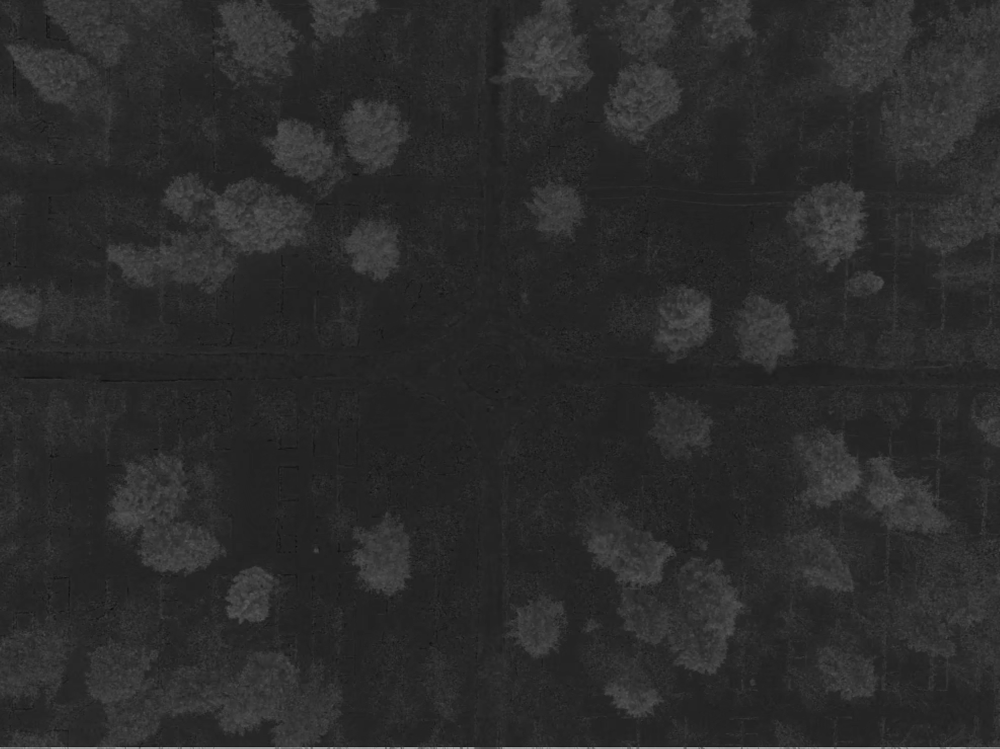

Visualización de VARI:


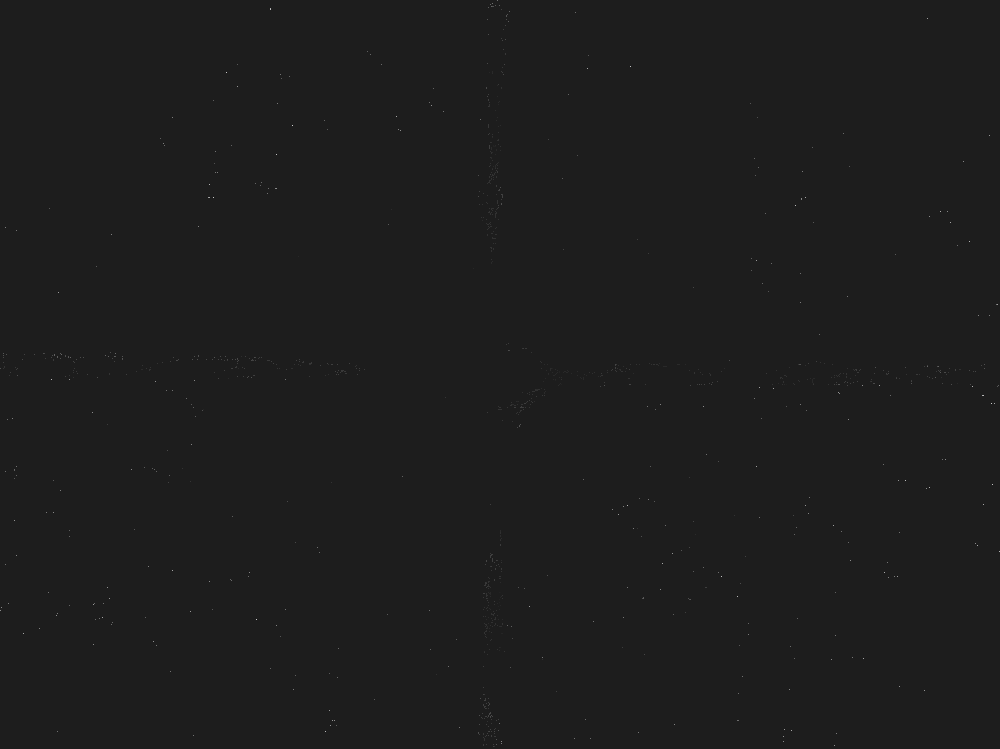

In [27]:
try:
    print(f"\n--- Bloque 1: Cálculo de Índices de Vegetación ---")
    print(f"Cargando imagen para cálculo de índices: '{my_image_path}'...")

    img_bgr = cv2.imread(my_image_path)

    if img_bgr is None:
        raise FileNotFoundError(f"No se pudo cargar la imagen desde la ruta: {my_image_path}")

    B = img_bgr[:, :, 0].astype(np.float32)
    G = img_bgr[:, :, 1].astype(np.float32)
    R = img_bgr[:, :, 2].astype(np.float32)

    # Cálculo de ExG
    ExG_array = 2 * G - R - B

    # Cálculo de VARI
    epsilon = 0.001
    denominator = (G + R - B + epsilon)
    VARI_array = (G - R) / denominator

    print("Cálculo de ExG y VARI completado para toda la imagen.")

    # --- NUEVA SECCIÓN PARA VISUALIZAR LOS ÍNDICES ---
    print("Visualizando arrays de índices (escala de grises)...")

    # Visualizar ExG
    # Normalizar ExG_array para que los valores estén en el rango 0-255 (para visualización)
    exg_display = cv2.normalize(ExG_array, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    img_exg = Image.fromarray(exg_display)
    print("Visualización de ExG:")
    display(img_exg)

    # Visualizar VARI
    # Normalizar VARI_array para que los valores estén en el rango 0-255
    # Asegúrate de manejar los casos de NaNs que puedan surgir de divisiones (aunque epsilon ayuda)
    vari_display = cv2.normalize(VARI_array, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    img_vari = Image.fromarray(vari_display)
    print("Visualización de VARI:")
    display(img_vari)

    # --- FIN DE LA NUEVA SECCIÓN ---

except Exception as e:
    print(f"Ocurrió un error en el Bloque 1 (Cálculo de Índices): {e}")


### Cálculo de Media de Índices y Actualización de DataFrame

In [28]:
if ('detections_df' in locals() and not detections_df.empty and
    'ExG_array' in locals() and 'VARI_array' in locals()):
    try:
        print(f"\n--- Bloque 2: Cálculo de Medias de Índices y Actualización de DataFrame ---")

        # Preparar el DataFrame para las nuevas columnas de media
        # Si detections_df ya tiene 'width', 'height', 'area_px', 'id_arbol' de un paso anterior,
        # asegúrate de que estén calculadas, o recalcularlas aquí si este es un script independiente.
        if 'width' not in detections_df.columns:
            detections_df['width'] = detections_df['xmax'] - detections_df['xmin']
            detections_df['height'] = detections_df['ymax'] - detections_df['ymin']
        if 'area_px' not in detections_df.columns:
            detections_df['area_px'] = detections_df['width'] * detections_df['height']
        if 'id_arbol' not in detections_df.columns:
             detections_df['id_arbol'] = detections_df.index


        # Listas para almacenar las medias de los índices
        exg_means = []
        vari_means = []

        # Itera sobre cada caja detectada en el DataFrame
        for index, row in detections_df.iterrows():
            xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])

            # Recorta la región del índice ExG para la caja actual
            exg_roi = ExG_array[ymin:ymax, xmin:xmax]
            # Calcula la media, ignorando NaNs (Not a Number) si los hubiera
            exg_means.append(np.nanmean(exg_roi) if exg_roi.size > 0 else np.nan)

            # Recorta la región del índice VARI para la caja actual
            vari_roi = VARI_array[ymin:ymax, xmin:xmax]
            vari_means.append(np.nanmean(vari_roi) if vari_roi.size > 0 else np.nan)

        # Agrega las columnas de medias al DataFrame
        detections_df['ExG_mean'] = exg_means
        detections_df['VARI_mean'] = vari_means

        # Selecciona y reordena las columnas para el DataFrame final, incluyendo las nuevas medias
        final_tree_data_df = detections_df[['id_arbol', 'xmin', 'ymin', 'xmax', 'ymax', 'area_px', 'ExG_mean', 'VARI_mean']]

        print("Cálculo de medias de índices completado y DataFrame actualizado.")
        print("\nDataFrame de resultados completo con medias de índices:")

        # Configurar opciones de Pandas para mostrar todas las filas
        pd.set_option('display.max_rows', None)
        pd.set_option('display.max_columns', None)
        pd.set_option('display.width', 1000)

        print(final_tree_data_df) # Imprimirá el DataFrame completo

        # Opcional: Restablecer las opciones de Pandas si lo deseas para futuras operaciones
        # pd.reset_option('display.max_rows')
        # pd.reset_option('display.max_columns')
        # pd.reset_option('display.width')

    except Exception as e:
        print(f"Ocurrió un error en el Bloque 2 (Cálculo de Medias o Actualización del DataFrame): {e}")
else:
    print("\nError: Asegúrate de que 'detections_df', 'ExG_array' y 'VARI_array' estén disponibles del Bloque 1.")


--- Bloque 2: Cálculo de Medias de Índices y Actualización de DataFrame ---
Cálculo de medias de índices completado y DataFrame actualizado.

DataFrame de resultados completo con medias de índices:
    id_arbol    xmin    ymin    xmax    ymax  area_px   ExG_mean  VARI_mean
0          0  1216.0   124.0  1337.0   249.0  15125.0  57.934414  11.734477
1          1  1589.0   371.0  1708.0   486.0  13685.0  62.756012  15.578065
2          2  1311.0   574.0  1402.0   668.0   8554.0  60.766541  12.830982
3          3  1464.0   599.0  1564.0   703.0  10400.0  56.237980   7.563364
4          4  1015.0    40.0  1136.0   169.0  15609.0  64.466331   4.534363
5          5   542.0   239.0   642.0   337.0   9800.0  61.819286  41.957916
6          6  1060.0   363.0  1154.0   461.0   9212.0  47.035824   1.326227
7          7   688.0   202.0   784.0   302.0   9600.0  63.252293  14.488195
8          8   690.0   433.0   782.0   527.0   8648.0  59.047756  17.403942
9          9   826.0   267.0   922.0   36

### Histogramas RGB de Regiones Detectadas vs. No Detectadas


--- Generando Histogramas RGB ---


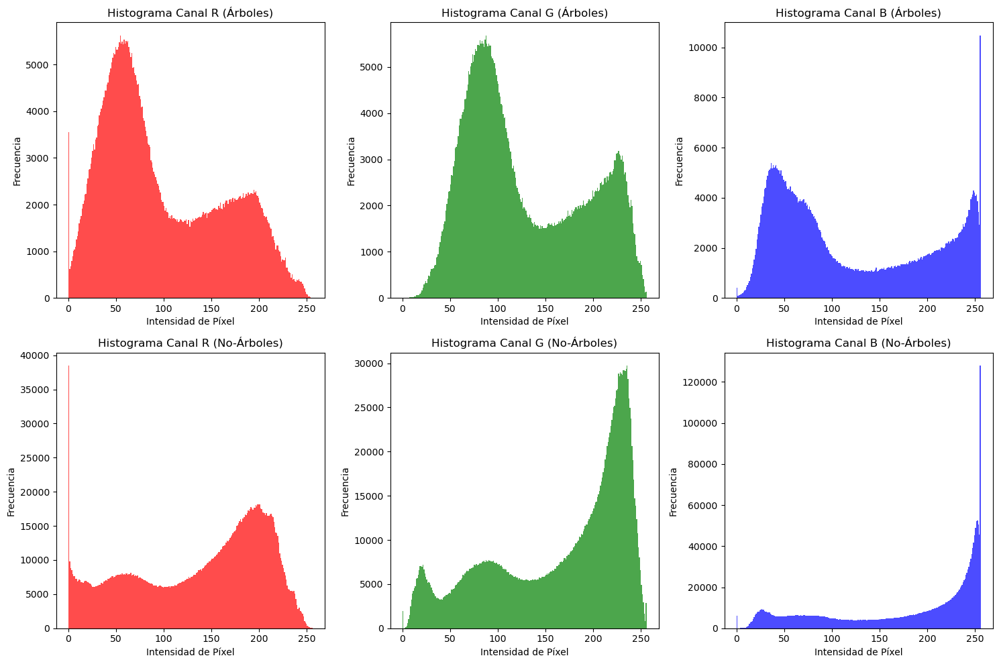

Histogramas generados exitosamente.


In [30]:
try:
    print(f"\n--- Generando Histogramas RGB ---")

    # 1. Cargar la imagen original (en formato BGR)
    # Reutilizamos img_bgr si ya la tienes de un bloque anterior, si no, la cargamos.
    if 'img_bgr' not in locals():
        img_bgr = cv2.imread(my_image_path)
        if img_bgr is None:
            raise FileNotFoundError(f"No se pudo cargar la imagen desde la ruta: {my_image_path}")
    
    # Obtener las dimensiones de la imagen
    height, width, _ = img_bgr.shape

    # 2. Crear una máscara para las regiones de árboles detectados
    # Inicializar una máscara de ceros (fondo negro)
    mask_trees = np.zeros((height, width), dtype=np.uint8)

    # Dibujar las bounding boxes rellenas en la máscara
    if 'detections_df' in locals() and not detections_df.empty:
        for index, row in detections_df.iterrows():
            xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
            # Asegurarse de que las coordenadas estén dentro de los límites de la imagen
            xmin = max(0, xmin)
            ymin = max(0, ymin)
            xmax = min(width, xmax)
            ymax = min(height, ymax)
            
            # Dibujar un rectángulo blanco (valor 255) en la máscara
            cv2.rectangle(mask_trees, (xmin, ymin), (xmax, ymax), 255, -1) # -1 para rellenar

        # 3. Crear una máscara para las regiones NO detectadas (fondo/no árboles)
        mask_non_trees = cv2.bitwise_not(mask_trees)

        # 4. Extraer los valores de píxeles para cada canal (BGR)
        # Convertir a RGB para que los histogramas sean R-G-B en lugar de B-G-R
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # Separar canales para ambas regiones
        # Píxeles de árboles
        R_trees = img_rgb[:, :, 0][mask_trees == 255]
        G_trees = img_rgb[:, :, 1][mask_trees == 255]
        B_trees = img_rgb[:, :, 2][mask_trees == 255]

        # Píxeles de no-árboles
        R_non_trees = img_rgb[:, :, 0][mask_non_trees == 255]
        G_non_trees = img_rgb[:, :, 1][mask_non_trees == 255]
        B_non_trees = img_rgb[:, :, 2][mask_non_trees == 255]

        # 5. Generar y plotear los 6 histogramas
        colors = ('red', 'green', 'blue')
        channel_names = ('Rojo', 'Verde', 'Azul')

        plt.figure(figsize=(15, 10)) # Tamaño de la figura para una mejor visualización

        # Histogramas para regiones de árboles
        plt.subplot(2, 3, 1) # 2 filas, 3 columnas, primer subplot
        plt.title('Histograma Canal R (Árboles)')
        plt.hist(R_trees, bins=256, range=[0, 256], color='red', alpha=0.7)
        plt.xlabel('Intensidad de Píxel')
        plt.ylabel('Frecuencia')

        plt.subplot(2, 3, 2)
        plt.title('Histograma Canal G (Árboles)')
        plt.hist(G_trees, bins=256, range=[0, 256], color='green', alpha=0.7)
        plt.xlabel('Intensidad de Píxel')
        plt.ylabel('Frecuencia')

        plt.subplot(2, 3, 3)
        plt.title('Histograma Canal B (Árboles)')
        plt.hist(B_trees, bins=256, range=[0, 256], color='blue', alpha=0.7)
        plt.xlabel('Intensidad de Píxel')
        plt.ylabel('Frecuencia')

        # Histogramas para regiones no-árboles
        plt.subplot(2, 3, 4)
        plt.title('Histograma Canal R (No-Árboles)')
        plt.hist(R_non_trees, bins=256, range=[0, 256], color='red', alpha=0.7)
        plt.xlabel('Intensidad de Píxel')
        plt.ylabel('Frecuencia')

        plt.subplot(2, 3, 5)
        plt.title('Histograma Canal G (No-Árboles)')
        plt.hist(G_non_trees, bins=256, range=[0, 256], color='green', alpha=0.7)
        plt.xlabel('Intensidad de Píxel')
        plt.ylabel('Frecuencia')

        plt.subplot(2, 3, 6)
        plt.title('Histograma Canal B (No-Árboles)')
        plt.hist(B_non_trees, bins=256, range=[0, 256], color='blue', alpha=0.7)
        plt.xlabel('Intensidad de Píxel')
        plt.ylabel('Frecuencia')

        plt.tight_layout() # Ajusta automáticamente los subplots para que no se superpongan
        plt.show() # Muestra la figura con los histogramas
        print("Histogramas generados exitosamente.")

    else:
        print("Error: El DataFrame 'detections_df' no está disponible o está vacío. Asegúrate de ejecutar el bloque de detección primero.")

except Exception as e:
    print(f"Ocurrió un error al generar los histogramas: {e}")

### Cálculo de Promedios RGB por Región

In [35]:
try:
    print(f"\n--- Bloque 1: Cálculo de Promedios RGB por Región ---")

    # 1. Cargar la imagen original (en formato BGR)
    if 'img_bgr' not in locals() or img_bgr is None: # Cargar si no existe o es None
        img_bgr = cv2.imread(my_image_path)
        if img_bgr is None:
            raise FileNotFoundError(f"No se pudo cargar la imagen desde la ruta: {my_image_path}")

    # Convertir a RGB para consistencia en el cálculo (OpenCV es BGR, Matplotlib/Pillow es RGB)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    height, width, _ = img_rgb.shape

    # Listas para almacenar los promedios RGB de árboles
    tree_avg_rgb = []
    if 'detections_df' in locals() and not detections_df.empty:
        print("Calculando promedios RGB para regiones de árboles...")
        for index, row in detections_df.iterrows():
            xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])

            # Asegurarse de que las coordenadas sean válidas y dentro de la imagen
            xmin = max(0, xmin)
            ymin = max(0, ymin)
            xmax = min(width, xmax)
            ymax = min(height, ymax)

            # Recortar la región del árbol
            tree_roi = img_rgb[ymin:ymax, xmin:xmax]

            if tree_roi.size > 0: # Asegurarse de que la ROI no esté vacía
                # Calcular el promedio de R, G, B para la región
                avg_R = np.mean(tree_roi[:, :, 0])
                avg_G = np.mean(tree_roi[:, :, 1])
                avg_B = np.mean(tree_roi[:, :, 2])
                tree_avg_rgb.append({'R': avg_R, 'G': avg_G, 'B': avg_B, 'Type': 'Arbol'})
    else:
        print("Advertencia: No se detectaron árboles o 'detections_df' está vacío. No se calcularán promedios para árboles.")

    # Listas para almacenar los promedios RGB de NO-árboles (muestras aleatorias)
    non_tree_avg_rgb = []
    num_non_tree_samples = len(detections_df) if not detections_df.empty else 50 # Número de muestras de no-árboles (al menos 50 si no hay árboles)
    patch_size = 50 # Tamaño de los parches cuadrados para las muestras de no-árboles (ej. 50x50 píxeles)

    print(f"Calculando promedios RGB para {num_non_tree_samples} muestras de no-árboles (tamaño de parche: {patch_size}x{patch_size})...")

    # Crear una máscara de NO-árboles (donde es seguro tomar muestras)
    mask_trees_for_sampling = np.zeros((height, width), dtype=np.uint8)
    if 'detections_df' in locals() and not detections_df.empty:
        for index, row in detections_df.iterrows():
            xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
            cv2.rectangle(mask_trees_for_sampling, (xmin, ymin), (xmax, ymax), 255, -1) # Dibujar árboles en blanco
    
    mask_non_trees_safe_zones = cv2.bitwise_not(mask_trees_for_sampling) # Todo lo que no sea árbol

    # Iterar para tomar muestras aleatorias de no-árboles
    samples_taken = 0
    max_attempts = num_non_tree_samples * 10 # Para evitar bucles infinitos si es difícil encontrar zonas
    attempts = 0

    while samples_taken < num_non_tree_samples and attempts < max_attempts:
        attempts += 1
        # Seleccionar una esquina superior izquierda aleatoria para el parche
        x_start = random.randint(0, width - patch_size)
        y_start = random.randint(0, height - patch_size)
        x_end = x_start + patch_size
        y_end = y_start + patch_size

        # Recortar la región candidata para el parche
        candidate_patch_mask = mask_non_trees_safe_zones[y_start:y_end, x_start:x_end]

        # Verificar si el parche está completamente dentro de la zona de no-árboles
        if np.all(candidate_patch_mask == 255): # Si todos los píxeles del parche son 255 (no-árbol)
            non_tree_roi = img_rgb[y_start:y_end, x_start:x_end]
            if non_tree_roi.size > 0:
                avg_R = np.mean(non_tree_roi[:, :, 0])
                avg_G = np.mean(non_tree_roi[:, :, 1])
                avg_B = np.mean(non_tree_roi[:, :, 2])
                non_tree_avg_rgb.append({'R': avg_R, 'G': avg_G, 'B': avg_B, 'Type': 'No-Arbol'})
                samples_taken += 1
        
    if samples_taken < num_non_tree_samples:
        print(f"Advertencia: Solo se pudieron tomar {samples_taken} muestras de no-árboles de {num_non_tree_samples} solicitadas.")


    # Combinar los promedios en un DataFrame para facilitar el trazado
    all_avg_rgb_df = pd.DataFrame(tree_avg_rgb + non_tree_avg_rgb)

    print("Cálculo de promedios RGB completado. Primeras 5 filas del DataFrame de promedios:")
    print(all_avg_rgb_df)
    print(f"Total de puntos para graficar: {len(all_avg_rgb_df)}")


except Exception as e:
    print(f"Ocurrió un error en el Bloque 1 (Cálculo de Promedios RGB): {e}")


--- Bloque 1: Cálculo de Promedios RGB por Región ---
Calculando promedios RGB para regiones de árboles...
Calculando promedios RGB para 63 muestras de no-árboles (tamaño de parche: 50x50)...
Cálculo de promedios RGB completado. Primeras 5 filas del DataFrame de promedios:
              R           G           B      Type
0     64.259835   96.682182   71.170116     Arbol
1     58.789404   93.749507   65.953599     Arbol
2     53.127893   79.778583   45.662731     Arbol
3     58.840769   84.250096   53.421442     Arbol
4     63.793709   93.767762   59.275482     Arbol
5     66.097959   98.991939   70.066633     Arbol
6     79.958207  100.836735   74.679440     Arbol
7     54.525312   83.562500   49.347396     Arbol
8     71.740171   94.432239   58.076549     Arbol
9    138.240126  158.411350  164.847656     Arbol
10    56.022792   83.310709   50.234205     Arbol
11    64.021298   87.109890   74.724708     Arbol
12   137.166106  153.844398  153.592017     Arbol
13    52.942894   85.7251

### Generación de Diagramas de Dispersión RGB


--- Bloque 2: Generación de Diagramas de Dispersión RGB ---


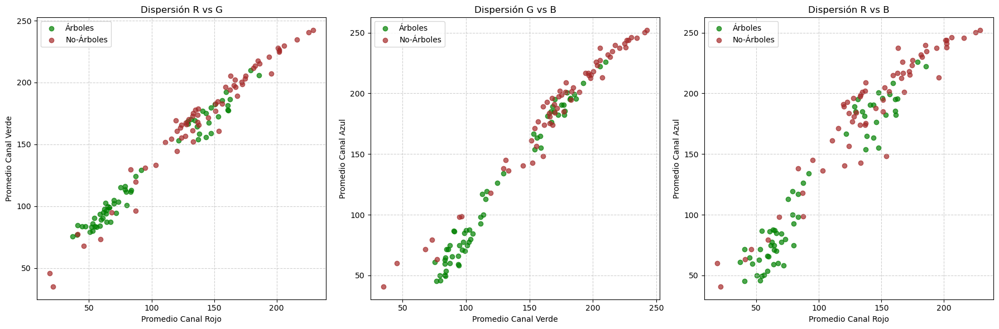

Diagramas de dispersión generados exitosamente.


In [36]:
if 'all_avg_rgb_df' in locals() and not all_avg_rgb_df.empty:
    try:
        print(f"\n--- Bloque 2: Generación de Diagramas de Dispersión RGB ---")

        # Separar los datos por tipo (Arbol vs. No-Arbol)
        trees_data = all_avg_rgb_df[all_avg_rgb_df['Type'] == 'Arbol']
        non_trees_data = all_avg_rgb_df[all_avg_rgb_df['Type'] == 'No-Arbol']

        # Definir colores para las clases
        tree_color = 'green' # Color para los puntos de árboles
        non_tree_color = 'brown' # Color para los puntos de no-árboles (ej. marrón para el suelo)

        plt.figure(figsize=(18, 6)) # Tamaño de la figura para los 3 subplots

        # Gráfico 1: R vs G
        plt.subplot(1, 3, 1) # 1 fila, 3 columnas, primer subplot
        plt.scatter(trees_data['R'], trees_data['G'], color=tree_color, label='Árboles', alpha=0.7)
        plt.scatter(non_trees_data['R'], non_trees_data['G'], color=non_tree_color, label='No-Árboles', alpha=0.7)
        plt.title('Dispersión R vs G')
        plt.xlabel('Promedio Canal Rojo')
        plt.ylabel('Promedio Canal Verde')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        # Gráfico 2: G vs B
        plt.subplot(1, 3, 2) # 1 fila, 3 columnas, segundo subplot
        plt.scatter(trees_data['G'], trees_data['B'], color=tree_color, label='Árboles', alpha=0.7)
        plt.scatter(non_trees_data['G'], non_trees_data['B'], color=non_tree_color, label='No-Árboles', alpha=0.7)
        plt.title('Dispersión G vs B')
        plt.xlabel('Promedio Canal Verde')
        plt.ylabel('Promedio Canal Azul')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        # Gráfico 3: R vs B
        plt.subplot(1, 3, 3) # 1 fila, 3 columnas, tercer subplot
        plt.scatter(trees_data['R'], trees_data['B'], color=tree_color, label='Árboles', alpha=0.7)
        plt.scatter(non_trees_data['R'], non_trees_data['B'], color=non_tree_color, label='No-Árboles', alpha=0.7)
        plt.title('Dispersión R vs B')
        plt.xlabel('Promedio Canal Rojo')
        plt.ylabel('Promedio Canal Azul')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        plt.tight_layout() # Ajusta los subplots para evitar superposiciones
        plt.show() # Muestra la figura con los diagramas de dispersión
        print("Diagramas de dispersión generados exitosamente.")

    except Exception as e:
        print(f"Ocurrió un error en el Bloque 2 (Generación de Diagramas de Dispersión): {e}")
else:
    print("\nError: El DataFrame 'all_avg_rgb_df' no está disponible del Bloque 1 o está vacío.")